# Laboratorio 07: Redes Neuronales 

## Dayana Andrea Henao Arbeláez 

In [161]:
import pandas as pd
import scipy as sc
import numpy as np
import h5py
import matplotlib.pylab as plt

In [162]:
data_train= "train_catvnoncat.h5"
train_dataset = h5py.File(data_train, "r")

data_test= "test_catvnoncat.h5"
test_dataset = h5py.File(data_test, "r")

In [163]:
train_dataset.keys()

<KeysViewHDF5 ['list_classes', 'train_set_x', 'train_set_y']>

In [164]:
# Read the data
xtrain_classes, xtrain, train_label =\
train_dataset["list_classes"],train_dataset["train_set_x"],train_dataset["train_set_y"]

test_classes, xtest,test_label =\
test_dataset["list_classes"],test_dataset["test_set_x"],test_dataset["test_set_y"]

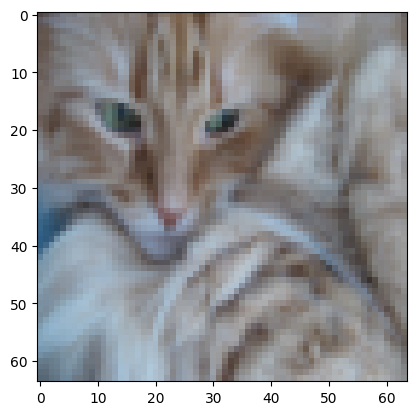

In [165]:
plt.imshow(xtrain[2])

In [166]:
len(xtrain)

209

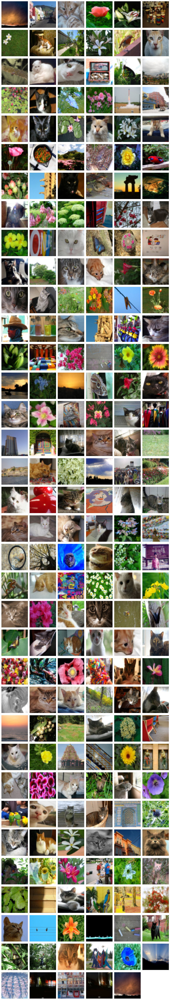

In [167]:
n = len(xtrain)
cols = 6                                     
rows = int(np.ceil(n / cols))               
plt.figure(figsize=(cols*2, rows*2))

for i in range(n):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(xtrain[i])       
    plt.axis('off')

plt.tight_layout()
plt.show()

In [168]:
64*64*3

12288

In [169]:
# Normalizar las imágenes 

xtrain_= np.reshape(xtrain,(209, 64*64*3))/255
xtest_ = np.reshape(xtest,(50, 64*64*3))/255

In [170]:
np.shape(xtrain)

(209, 64, 64, 3)

In [171]:
np.shape(xtrain_)

(209, 12288)

In [172]:
np.shape(xtrain[0])

(64, 64, 3)

In [173]:
64*64*3

12288

In [174]:
class Neural_Network():
    '''
    Red neuronal feedforward para clasificación binaria entrenada mediante
    descenso por gradiente y retropropagación.

    Permite definir una arquitectura arbitraria, utiliza ReLU en las capas
    ocultas y sigmoide en la capa de salida, y evalúa el desempeño sobre
    conjuntos de entrenamiento y prueba.
    '''

    def __init__(self, N_epoch, structure, Xtrain, ytrain, Xtest, ytest, alpha):
        '''
        Inicializa la red neuronal con la arquitectura, los datos,
        el número de épocas y la tasa de aprendizaje.
        '''
        self.N_epoch = N_epoch
        self.structure = structure
        self.m_train = len(ytrain)
        self.m_test = len(ytest)
        self.Xtrain = Xtrain
        self.ytrain = ytrain
        self.Xtest = Xtest
        self.ytest = ytest
        self.alpha = alpha

    def ReLU(self, x):
        '''
        Función de activación ReLU.
        Devuelve x si x ≥ 0, o 0 en caso contrario.
        '''
        return x if x >= 0 else 0.0

    def Sigmoid(self, x):
        '''
        Función de activación sigmoide, utilizada en la capa de salida.
        '''
        return 1 / (1 + np.exp(-x))

    def DReLU(self, x):
        '''
        Derivada de la función ReLU.
        '''
        return 1 if x >= 0 else 0.0
    def Cost(self, A_L):
        '''
        Calcula la función de coste de entropía cruzada sobre los
        datos de entrenamiento.
        '''
        return -(1 / self.m_train) * np.sum(
            self.ytrain * np.log(A_L) + (1 - self.ytrain) * np.log(1 - A_L)
        )

    def Forward(self, g, A_l_1, W_l, b_l):
        '''
        Realiza la propagación hacia adelante de una capa.
        '''
        Z_l = W_l @ A_l_1 + b_l
        A_l = np.vectorize(g)(Z_l)
        return A_l, Z_l

    def Backward_L(self, delta_L, A_L_1, W_L, b_L):
        '''
        Retropropagación en la capa de salida y actualización
        de pesos y sesgos.
        '''
        dJdW = (1 / self.m_train) * delta_L @ A_L_1.T
        dJdb = (1 / self.m_train) * np.sum(delta_L, axis=0)
        W_L -= self.alpha * dJdW
        b_L -= self.alpha * dJdb
        return W_L, b_L

    def Backward(self, delta_l1, W_l1, Z_l, A_l_1, W_l, b_l):
        '''
        Retropropagación en una capa oculta y actualización
        de pesos, sesgos y término delta.
        '''
        delta_l = (W_l1.T @ delta_l1) * np.vectorize(self.DReLU)(Z_l)
        dJdW = (1 / self.m_train) * delta_l @ A_l_1.T
        dJdb = (1 / self.m_train) * np.sum(delta_l, axis=0)
        W_l -= self.alpha * dJdW
        b_l -= self.alpha * dJdb
        return W_l, b_l, delta_l

    def Initialization(self):
        '''
        Inicializa aleatoriamente los pesos y sesgos de la red y
        ejecuta una pasada inicial de forward y backward.
        '''
        A = np.empty(len(self.structure), dtype=object)
        Z = np.empty(len(self.structure), dtype=object)
        W = np.empty(len(self.structure), dtype=object)
        b = np.empty(len(self.structure), dtype=object)
        delta = np.empty(len(self.structure), dtype=object)

        A[0] = self.Xtrain
        Z[0] = W[0] = b[0] = 0

        for l, nl in enumerate(self.structure[1:-1], start=1):
            nl_1 = A[l-1].shape[0]
            W[l] = 1 - 2 * np.random.random((nl, nl_1))
            b[l] = np.tile(1 - 2 * np.random.random(nl), (self.m_train, 1)).T
            A[l], Z[l] = self.Forward(self.ReLU, A[l-1], W[l], b[l])

        nL = self.structure[-1]
        nL_1 = A[-2].shape[0]
        W[-1] = 1 - 2 * np.random.random((nL, nL_1))
        b[-1] = np.tile(1 - 2 * np.random.random(nL), (self.m_train, 1)).T
        A[-1], Z[-1] = self.Forward(self.Sigmoid, A[-2], W[-1], b[-1])

        delta[-1] = A[-1] - self.ytrain

        W_n = np.empty(len(self.structure), dtype=object)
        b_n = np.empty(len(self.structure), dtype=object)
        W_n[0] = b_n[0] = 0
        W_n[-1], b_n[-1] = self.Backward_L(delta[-1], A[-2], W[-1], b[-1])

        for l in range(len(self.structure)-2, 0, -1):
            W_n[l], b_n[l], delta[l] = self.Backward(
                delta[l+1], W[l+1], Z[l], A[l-1], W[l], b[l]
            )

        return W_n, b_n

    def bin(self, x):
        '''
        Convierte una probabilidad en una etiqueta binaria
        usando un umbral de 0.5.
        '''
        return 0 if x < 0.5 else 1

    def Binary_Classification(self):
        '''
        Entrena la red neuronal, imprime el desempeño por época
        y guarda los pesos finales del modelo.
        '''
        W, b = self.Initialization()
        
        # Listas para guardar el historial
        self.cost_history = []
        self.train_acc_history = []
        self.test_acc_history = []

        for epoch in range(1, self.N_epoch + 1):
            A = np.empty(len(self.structure), dtype=object)
            Z = np.empty(len(self.structure), dtype=object)
            A_test = np.empty(len(self.structure), dtype=object)
            Z_test = np.empty(len(self.structure), dtype=object)

            A[0] = self.Xtrain
            A_test[0] = self.Xtest

            for l in range(1, len(self.structure)-1):
                A[l], Z[l] = self.Forward(self.ReLU, A[l-1], W[l], b[l])
                A_test[l], Z_test[l] = self.Forward(
                    self.ReLU, A_test[l-1], W[l], b[l][:, :self.m_test]
                )

            A[-1], Z[-1] = self.Forward(self.Sigmoid, A[-2], W[-1], b[-1])
            A_test[-1], _ = self.Forward(
                self.Sigmoid, A_test[-2], W[-1], b[-1][:, :self.m_test]
            )

            Output_train = np.vectorize(self.bin)(A[-1])
            Output_test = np.vectorize(self.bin)(A_test[-1])

            Train_score = np.mean(Output_train == self.ytrain)
            Test_score = np.mean(Output_test == self.ytest)
            cost_function = self.Cost(A[-1])
            
            # Guardar métricas
            self.cost_history.append(cost_function)
            self.train_acc_history.append(Train_score)
            self.test_acc_history.append(Test_score)

            print(f'Epoch {epoch}/{self.N_epoch} | '
                  f'Train: {Train_score} | Test: {Test_score} | Cost: {cost_function}')

            delta = np.empty(len(self.structure), dtype=object)
            delta[-1] = A[-1] - self.ytrain

            W_n = np.empty(len(self.structure), dtype=object)
            b_n = np.empty(len(self.structure), dtype=object)
            W_n[0] = b_n[0] = 0
            W_n[-1], b_n[-1] = self.Backward_L(delta[-1], A[-2], W[-1], b[-1])

            for l in range(len(self.structure)-2, 0, -1):
                W_n[l], b_n[l], delta[l] = self.Backward(
                    delta[l+1], W[l+1], Z[l], A[l-1], W[l], b[l]
                )

            W, b = W_n, b_n

        self.W = W
        self.b = b

    def Prediction(self, x):
        '''
        Predice las etiquetas binarias de nuevos datos
        utilizando la red entrenada.
        '''
        mx = x.shape[1]
        A = np.empty(len(self.structure), dtype=object)
        A[0] = x

        for l in range(1, len(self.structure)-1):
            A[l], _ = self.Forward(self.ReLU, A[l-1], self.W[l], self.b[l][:, :mx])

        A[-1], _ = self.Forward(
            self.Sigmoid, A[-2], self.W[-1], self.b[-1][:, :mx]
        )

        return np.vectorize(self.bin)(A[-1])

In [175]:
xtrain_classes, xtrain, train_label = train_dataset["list_classes"],train_dataset["train_set_x"],train_dataset["train_set_y"]

test_classes, xtest,test_label = test_dataset["list_classes"],test_dataset["test_set_x"],test_dataset["test_set_y"]

ytrain = np.array(list(train_label))
Xtrain = (np.reshape(xtrain,(209, 64*64*3))/255).T

ytest = np.array(list(test_label))
Xtest = (np.reshape(xtest,(50, 64*64*3))/255).T

topology = np.array([12288, 8, 6, 1]) 

In [176]:
modelo = Neural_Network(100,topology,Xtrain,ytrain,Xtest,ytest,0.01)

In [177]:
modelo.Binary_Classification()

Epoch 1/100 | Train: 0.5454545454545454 | Test: 0.38 | Cost: 2.3593722022048356
Epoch 2/100 | Train: 0.5454545454545454 | Test: 0.38 | Cost: 2.1263573589417537
Epoch 3/100 | Train: 0.5502392344497608 | Test: 0.36 | Cost: 1.9353930799789238
Epoch 4/100 | Train: 0.5645933014354066 | Test: 0.36 | Cost: 1.7765577037355362
Epoch 5/100 | Train: 0.5598086124401914 | Test: 0.36 | Cost: 1.6413160135253677
Epoch 6/100 | Train: 0.5550239234449761 | Test: 0.36 | Cost: 1.52284657574678
Epoch 7/100 | Train: 0.5550239234449761 | Test: 0.36 | Cost: 1.4120291140157222
Epoch 8/100 | Train: 0.5502392344497608 | Test: 0.36 | Cost: 1.3137162126143753
Epoch 9/100 | Train: 0.5550239234449761 | Test: 0.36 | Cost: 1.2296376939786888
Epoch 10/100 | Train: 0.5550239234449761 | Test: 0.36 | Cost: 1.1520330165556036
Epoch 11/100 | Train: 0.5598086124401914 | Test: 0.38 | Cost: 1.0885274362347295
Epoch 12/100 | Train: 0.5502392344497608 | Test: 0.38 | Cost: 1.0350848405152933
Epoch 13/100 | Train: 0.555023923444976

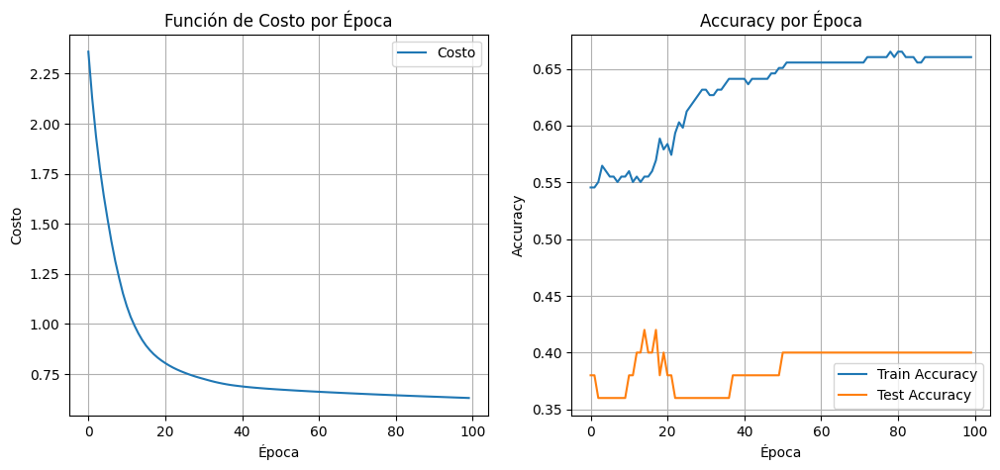

In [178]:
# Graficar Costo y Accuracy
plt.figure(figsize=(12, 5))

# Gráfica de Costo
plt.subplot(1, 2, 1)
plt.plot(modelo.cost_history, label='Costo')
plt.title('Función de Costo por Época')
plt.xlabel('Época')
plt.ylabel('Costo')
plt.grid()
plt.legend()

# Gráfica de Accuracy
plt.subplot(1, 2, 2)
plt.plot(modelo.train_acc_history, label='Train Accuracy')
plt.plot(modelo.test_acc_history, label='Test Accuracy')
plt.title('Accuracy por Época')
plt.xlabel('Época')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()

plt.show()

In [179]:
print('Predicción: {}\nRealidad: {}'.format(modelo.Prediction(Xtest[:,0:10])[0],ytest[0:10]))

Predicción: [1 0 0 0 0 0 0 0 0 1]
Realidad: [1 1 1 1 1 0 1 1 1 1]


In [180]:
# Calcular el porcentaje de aciertos en el conjunto de prueba
predicciones = modelo.Prediction(Xtest)
accuracy = np.mean(predicciones == ytest) * 100

print(f"Porcentaje de aciertos (Accuracy): {accuracy}%")

Porcentaje de aciertos (Accuracy): 40.0%


El modelo alcanza porcentajes de acierto entre un 30 % y un 66 %, dependiendo de su topología. Sin embargo, no logra superar este rango, lo que implica que su capacidad predictiva es baja. 